### [执行一次即可]转换前向模型并保存

In [1]:
trained_model_path = 'models/resnet50_csv_03.h5'
inference_model_save_path = "models/RetinaNet/retinanet_inference.h5"

In [2]:
import subprocess

convert_command = ['python', 'keras-retinanet/keras_retinanet/bin/convert_model.py', '--no-class-specific-filter', trained_model_path, inference_model_save_path]
print('开始模型转换...')
process = subprocess.Popen(convert_command)
process.wait()
if process.returncode != 0:
    print(f"模型转换失败，失败码：{process.returncode}")
else:
    print('模型转换成功!')

开始模型转换...
模型转换成功!


### 加载检测器 detector

In [3]:
# show images inline
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import keras
import keras

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
from keras_retinanet.utils.gpu import setup_gpu

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

# use this to change which GPU to use
gpu = 0

# set the modified tf session as backend in keras
setup_gpu(gpu)

Using TensorFlow backend.


1 Physical GPUs, 1 Logical GPUs


In [4]:
detector = models.load_model(inference_model_save_path, backbone_name='resnet50')

tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-22.627417, -11.313708,  22.627417,  11.313708],
       [-28.50876 , -14.25438 ,  28.50876 ,  14.25438 ],
       [-35.918785, -17.959393,  35.918785,  17.959393],
       [-16.      , -16.      ,  16.      ,  16.      ],
       [-20.158737, -20.158737,  20.158737,  20.158737],
       [-25.398417, -25.398417,  25.398417,  25.398417],
       [-11.313708, -22.627417,  11.313708,  22.627417],
       [-14.25438 , -28.50876 ,  14.25438 ,  28.50876 ],
       [-17.959393, -35.918785,  17.959393,  35.918785]], dtype=float32)> anchors
tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-45.254833, -22.627417,  45.254833,  22.627417],
       [-57.01752 , -28.50876 ,  57.01752 ,  28.50876 ],
       [-71.83757 , -35.918785,  71.83757 ,  35.918785],
       [-32.      , -32.      ,  32.      ,  32.      ],
       [-40.317474, -40.317474,  40.317474,  40.317474],
       [-50.796833, -50.796833,  50.7

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [5]:
detector.summary()

Model: "retinanet-bbox"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
padding_conv1 (ZeroPadding2D)   (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9408        padding_conv1[0][0]              
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, None, None, 6 256         conv1[0][0]                      
_____________________________________________________________________________________

### 加载检测 类别名称 detector_class_name

In [6]:
import pandas as pd

df = pd.read_csv("data/baijiu/class.csv", header=None)

# load label to names mapping for visualization purposes
detector_class_name = df[0].values.tolist()

In [7]:
detector_class_name

['bag', 'bottle', 'jar', 'bucket', 'box', 'others']

### 加载分类器 classifier

In [8]:
import tensorflow as tf

classifier = tf.keras.models.load_model("models/ResNet50/ResNet50_classified.h5")

In [9]:
classifier.summary()

Model: "ResNet50_classified"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
________________________________________________________________________________

### [执行一次即可]提取分类 类别名称 classifier_class_name

In [10]:
train_dataset_path = "data/classified/train"

import os
classifier_class_name = list(
    filter(
        lambda x: not x.startswith(".")
        and os.path.isdir(os.path.join(train_dataset_path, x)),
        os.listdir(train_dataset_path),
    )
)
print(f"类别总数：{len(classifier_class_name)}")

类别总数：166


In [12]:
classifier_class_name

['泸州老窖宫廷酒',
 'RIO蓝',
 '牛栏山42度子豪500ml',
 '西凤酒52度华山论剑10年、20年陈酿500ml',
 '绵竹大曲52度500ml',
 '洋河蓝优',
 '江小白40度JOYYOUTH500ml',
 '塔牌42度陈年烧白酒2.5L',
 '红星二锅头43度绵柔8陈酿100ml',
 '红星二锅头52度500ml',
 '茅台醇香酒',
 '红星二锅头酒56度100ml',
 '四川红高粱',
 '伊力52度十年老陈酒250ml',
 '北京军功二锅头',
 '泸州老窖42度500ml',
 '洋城大曲',
 '青瓷潭',
 '牛栏山65度二锅头白酒500ml',
 '牛栏山42度陈酿白酒500ml',
 '老白干青花瓷',
 '绵竹酒',
 '牡丹酒',
 '牛栏山52度陈酿白酒500ml',
 '镇江白酒',
 '牛栏山42.8度十八年陈酿500ml（大青牛）',
 '小郎酒45度',
 '牛栏山42度陈酿白酒750ml',
 '竹叶青酒500ml',
 '剑南',
 '百年泸州老窖宫廷酒',
 '茅台酒',
 '永丰北京二锅头42度出口小方瓶100ml、500ml',
 '泸州老窖52度头曲500ml',
 '小糊涂仙52度500ml',
 '永丰牌北京二锅头42度小方瓶500ml',
 '今世缘',
 '四川高粱酒',
 '郑万利特制糟烧白酒50度5L',
 '老白干桶装',
 '古井囍酒500ml',
 '绵竹大曲',
 '西凤酒52度铂金年份封藏500ml',
 '牛栏山45度珍品十八年陈酿400ml',
 '红星二锅头65度500ml',
 '东风糟烧2.5L',
 '牛栏山42度十二年陈酿255ml（小青牛）',
 '北京二锅头56度5L',
 '国窖经典盒装',
 '古川',
 '宣酒',
 '泸州老窖38度淡雅六年陈窖500ml',
 '道光',
 '牛栏山42度陈酿白酒265ml',
 '红星二锅头蓝',
 '古井45度陈酿酒450ml',
 '毛铺苦荞酒42度425ml',
 '泸州老窖二曲红黄',
 '江小白40度Straight高粱酒300ml',
 '泰山老陈酒15窖藏500ml',
 '毛铺',
 '二锅头酒',
 '古越龙山绍兴黄酒花雕糯米酒',
 '郎牌',
 '茅台王子酒',
 '小郎酒45度

### 保存类别名称文件

In [13]:
with open("models/ResNet50/ResNet50_classified_class.txt", "w+") as f:
    f.write(str(classifier_class_name))

### 加载类别名称文件

In [15]:
with open("models/ResNet50/ResNet50_classified_class.txt", "r+") as f:
    classifier_class_name = eval(f.read())

In [17]:
classifier_class_name[:10]

['泸州老窖宫廷酒',
 'RIO蓝',
 '牛栏山42度子豪500ml',
 '西凤酒52度华山论剑10年、20年陈酿500ml',
 '绵竹大曲52度500ml',
 '洋河蓝优',
 '江小白40度JOYYOUTH500ml',
 '塔牌42度陈年烧白酒2.5L',
 '红星二锅头43度绵柔8陈酿100ml',
 '红星二锅头52度500ml']

## 检测+分类

In [18]:
def load_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_tensor = image.img_to_array(img)                    
    img_tensor = np.expand_dims(img_tensor, axis=0)         
    img_tensor /= 255.                                      

    plt.imshow(img_tensor[0])                           
    plt.axis('off')
    plt.show()

    return img_tensor

In [19]:
# 商品检测
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.imagenet_utils import preprocess_input

test_image_path = 'test_1.jpg'
test_dir = "test/"

# 读取图像
input_image = read_image_bgr(test_image_path)

# 预处理
input_image = preprocess_image(input_image)
input_image, scale = resize_image(input_image)

# 计时开始
start = time.time()
# 商品检测
boxes, scores, labels = detector.predict_on_batch(np.expand_dims(input_image, axis=0))

# 图像尺寸矫正
boxes /= scale

In [20]:
# 分类结果画图，重新读取原图
draw = read_image_bgr(test_image_path).copy()
draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

In [21]:
# 记录分类结果
idx = 0
predict_list = []

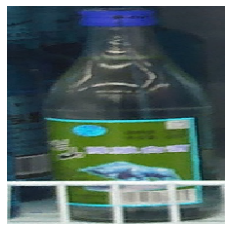

19 牛栏山42度陈酿白酒500ml 0.6891249418258667


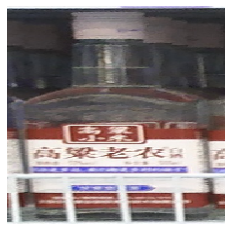

144 五粮醇 0.23620787262916565


/root/.local/lib/python3.6/site-packages/keras_retinanet/utils/colors.py:18: UserWarning: Label 144 has no color, returning default.
  warnings.warn('Label {} has no color, returning default.'.format(label))


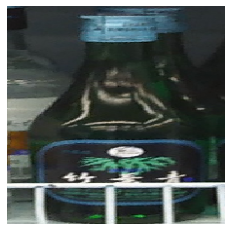

19 牛栏山42度陈酿白酒500ml 0.646822452545166


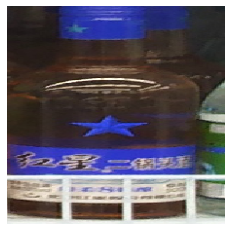

19 牛栏山42度陈酿白酒500ml 0.2786044776439667


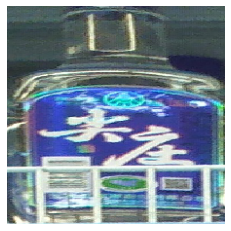

46 牛栏山42度十二年陈酿255ml（小青牛） 0.2837969958782196


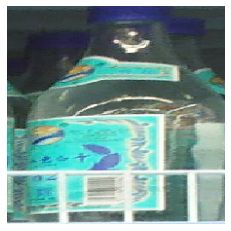

50 宣酒 0.2979753911495209


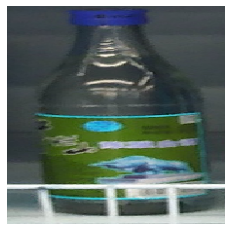

19 牛栏山42度陈酿白酒500ml 0.5201951861381531


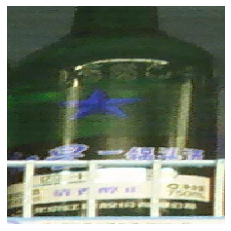

68 牛栏山43度珍品陈酿白酒500ml 0.18897530436515808


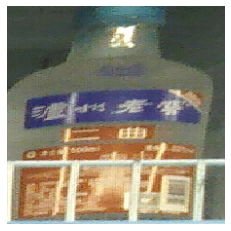

144 五粮醇 0.45767951011657715


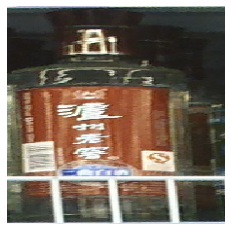

65 小郎酒45度炫彩小瓶100ml 0.5500897765159607


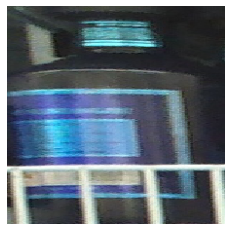

144 五粮醇 0.25735795497894287


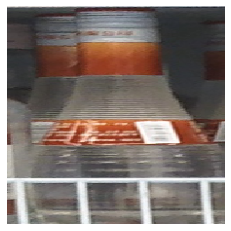

144 五粮醇 0.46714603900909424


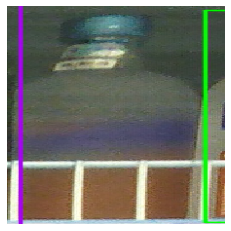

69 牛栏山56度二锅头白酒500ml 0.4510524272918701


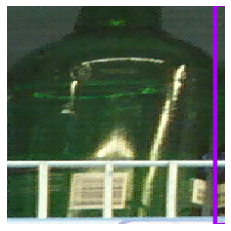

144 五粮醇 0.5343279838562012


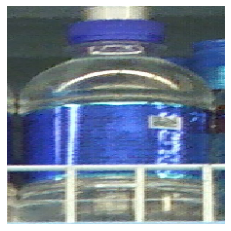

50 宣酒 0.31125152111053467


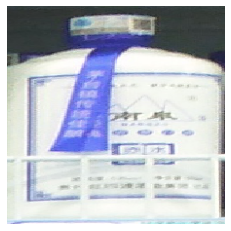

50 宣酒 0.4944813549518585


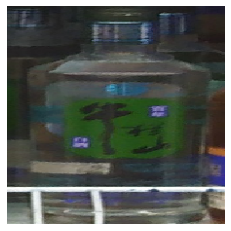

54 红星二锅头蓝 0.6351625323295593


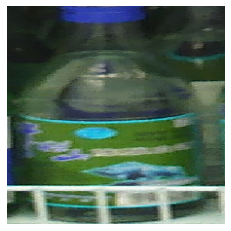

19 牛栏山42度陈酿白酒500ml 0.5028194785118103


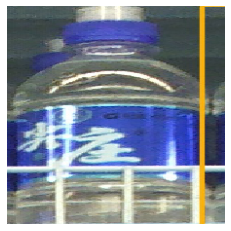

50 宣酒 0.2769162058830261


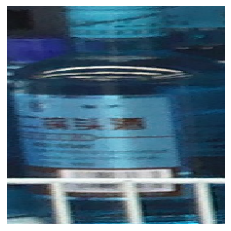

68 牛栏山43度珍品陈酿白酒500ml 0.23866252601146698


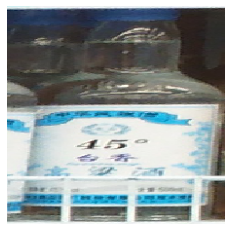

27 牛栏山42度陈酿白酒750ml 0.42708542943000793


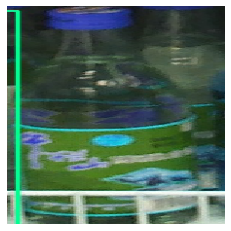

69 牛栏山56度二锅头白酒500ml 0.3258679211139679


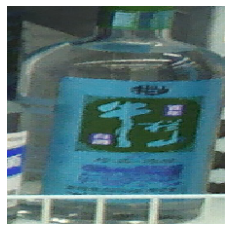

68 牛栏山43度珍品陈酿白酒500ml 0.1593184620141983


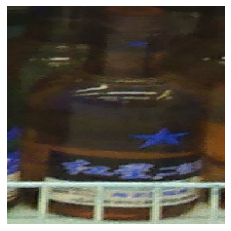

54 红星二锅头蓝 0.3872876763343811


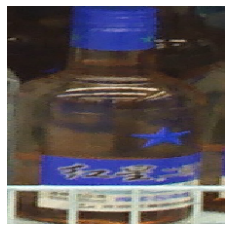

69 牛栏山56度二锅头白酒500ml 0.2956262528896332


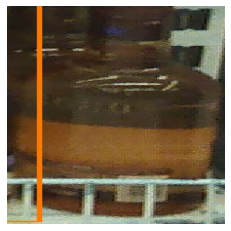

68 牛栏山43度珍品陈酿白酒500ml 0.20406153798103333


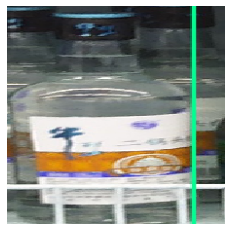

19 牛栏山42度陈酿白酒500ml 0.19496816396713257


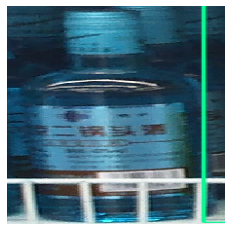

144 五粮醇 0.5325316786766052


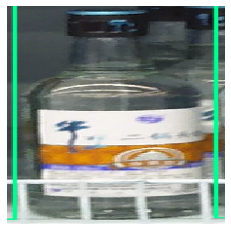

29 剑南 0.6214873194694519


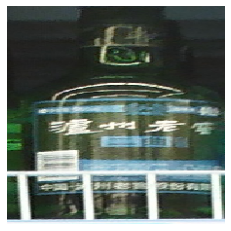

65 小郎酒45度炫彩小瓶100ml 0.2123514860868454


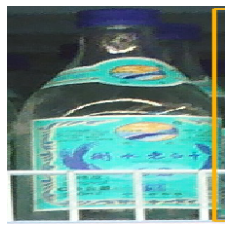

50 宣酒 0.16266103088855743


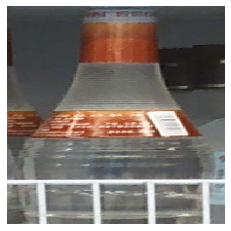

19 牛栏山42度陈酿白酒500ml 0.17678047716617584


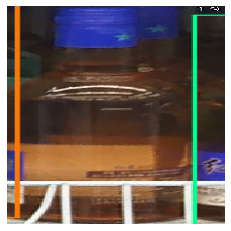

144 五粮醇 0.21486103534698486


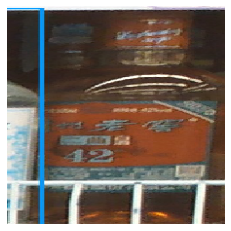

68 牛栏山43度珍品陈酿白酒500ml 0.13474084436893463


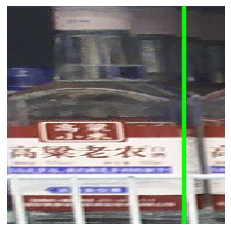

19 牛栏山42度陈酿白酒500ml 0.35064128041267395


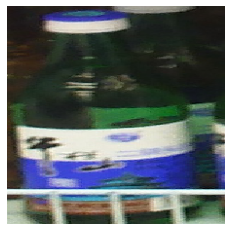

19 牛栏山42度陈酿白酒500ml 0.22387215495109558


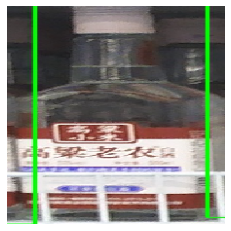

27 牛栏山42度陈酿白酒750ml 0.4123653173446655


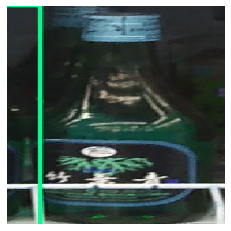

19 牛栏山42度陈酿白酒500ml 0.3618180453777313


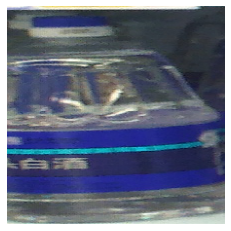

68 牛栏山43度珍品陈酿白酒500ml 0.3646940290927887


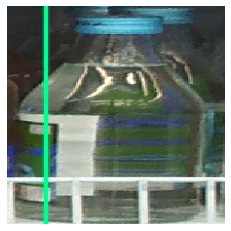

68 牛栏山43度珍品陈酿白酒500ml 0.23750996589660645


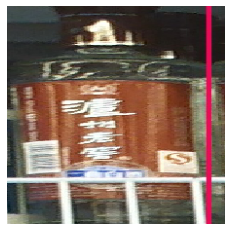

65 小郎酒45度炫彩小瓶100ml 0.6295428276062012


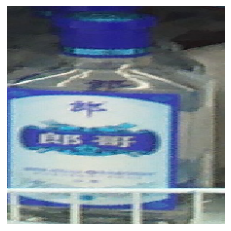

27 牛栏山42度陈酿白酒750ml 0.22337934374809265


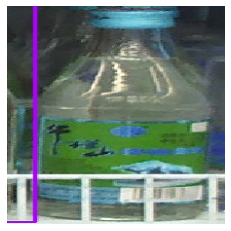

68 牛栏山43度珍品陈酿白酒500ml 0.18801769614219666


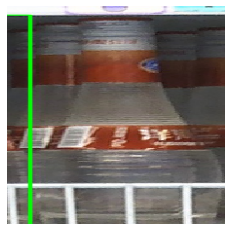

19 牛栏山42度陈酿白酒500ml 0.23574328422546387


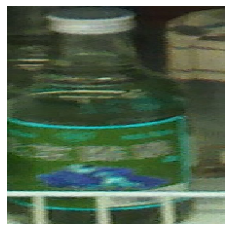

69 牛栏山56度二锅头白酒500ml 0.2937413156032562


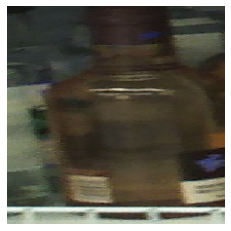

68 牛栏山43度珍品陈酿白酒500ml 0.5571392774581909


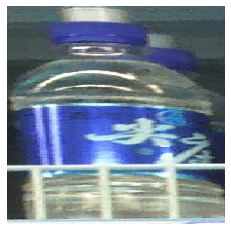

50 宣酒 0.41830575466156006


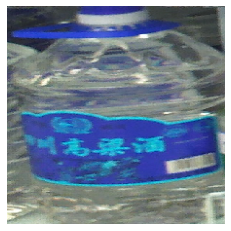

68 牛栏山43度珍品陈酿白酒500ml 0.30782774090766907


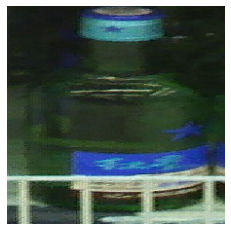

69 牛栏山56度二锅头白酒500ml 0.3326159715652466


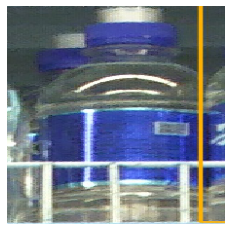

50 宣酒 0.3864573836326599


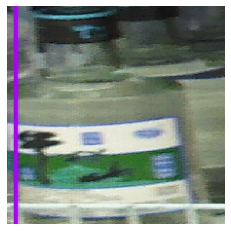

69 牛栏山56度二锅头白酒500ml 0.3707466125488281


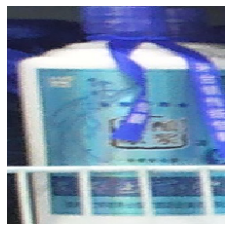

25 牛栏山42.8度十八年陈酿500ml（大青牛） 0.25568366050720215


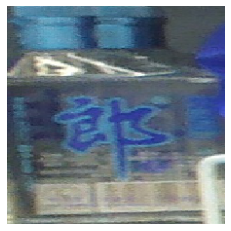

68 牛栏山43度珍品陈酿白酒500ml 0.21662867069244385


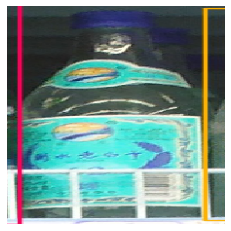

24 镇江白酒 0.27070000767707825


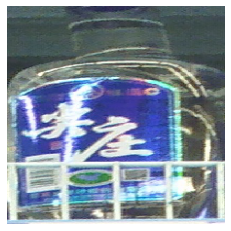

46 牛栏山42度十二年陈酿255ml（小青牛） 0.26341238617897034


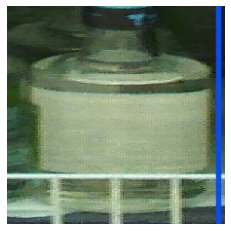

29 剑南 0.20051826536655426


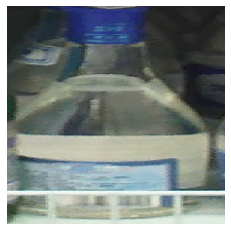

69 牛栏山56度二锅头白酒500ml 0.30994102358818054


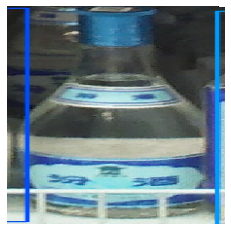

23 牛栏山52度陈酿白酒500ml 0.08254840970039368


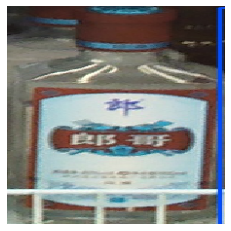

27 牛栏山42度陈酿白酒750ml 0.19628725945949554


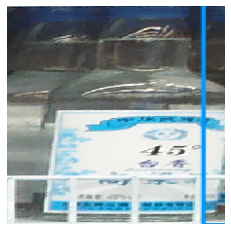

27 牛栏山42度陈酿白酒750ml 0.2990139424800873


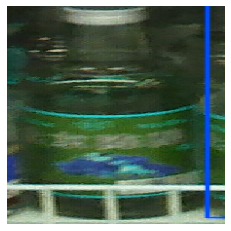

19 牛栏山42度陈酿白酒500ml 0.19422750174999237


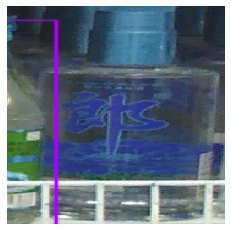

68 牛栏山43度珍品陈酿白酒500ml 0.22286465764045715


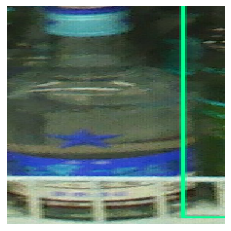

69 牛栏山56度二锅头白酒500ml 0.24241353571414948


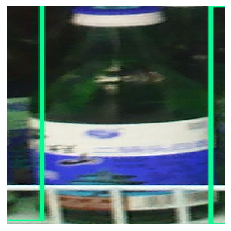

19 牛栏山42度陈酿白酒500ml 0.23424875736236572


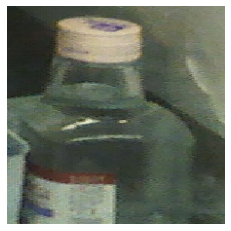

69 牛栏山56度二锅头白酒500ml 0.1768409013748169


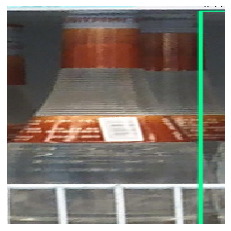

19 牛栏山42度陈酿白酒500ml 0.263959676027298


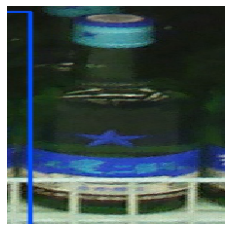

19 牛栏山42度陈酿白酒500ml 0.27981340885162354


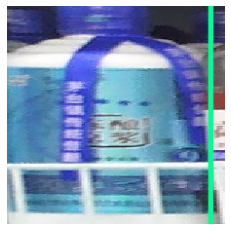

50 宣酒 0.5951736569404602


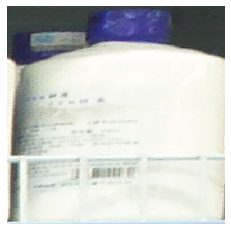

113 柔和 0.3024362027645111


/root/.local/lib/python3.6/site-packages/keras_retinanet/utils/colors.py:18: UserWarning: Label 113 has no color, returning default.
  warnings.warn('Label {} has no color, returning default.'.format(label))


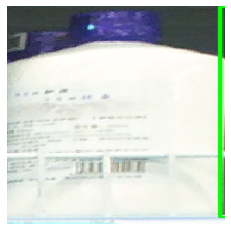

113 柔和 0.37508970499038696


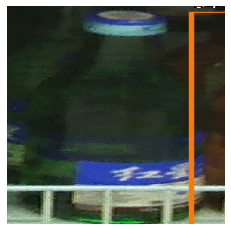

19 牛栏山42度陈酿白酒500ml 0.20108449459075928


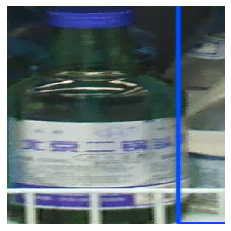

24 镇江白酒 0.2836795747280121


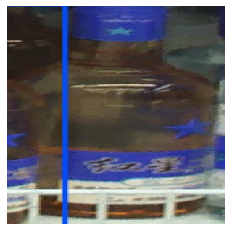

68 牛栏山43度珍品陈酿白酒500ml 0.29567039012908936


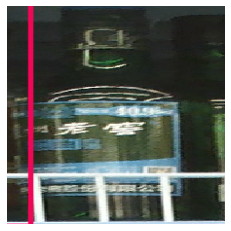

27 牛栏山42度陈酿白酒750ml 0.198594868183136


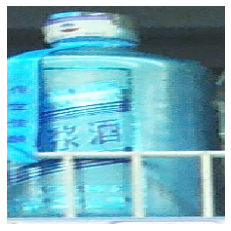

68 牛栏山43度珍品陈酿白酒500ml 0.24645596742630005


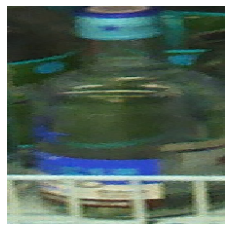

68 牛栏山43度珍品陈酿白酒500ml 0.2533453404903412


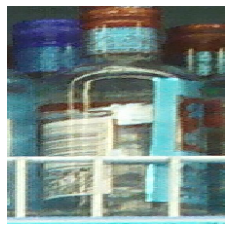

50 宣酒 0.26266857981681824


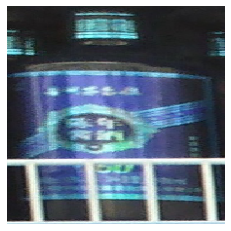

50 宣酒 0.20205625891685486


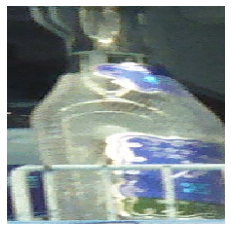

50 宣酒 0.34129831194877625


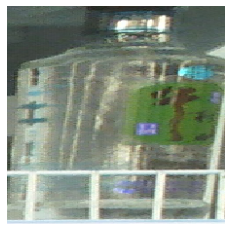

68 牛栏山43度珍品陈酿白酒500ml 0.1535341441631317


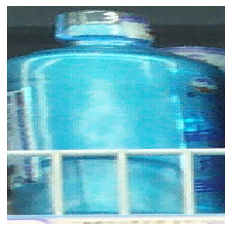

68 牛栏山43度珍品陈酿白酒500ml 0.4747700095176697


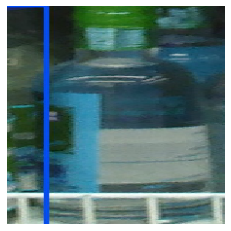

68 牛栏山43度珍品陈酿白酒500ml 0.375781774520874


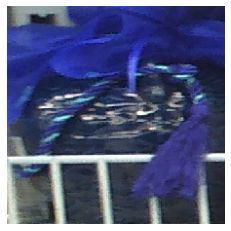

150 尖庄 0.2648961842060089


/root/.local/lib/python3.6/site-packages/keras_retinanet/utils/colors.py:18: UserWarning: Label 150 has no color, returning default.
  warnings.warn('Label {} has no color, returning default.'.format(label))


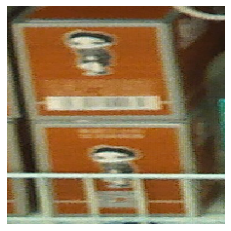

19 牛栏山42度陈酿白酒500ml 0.1483810544013977


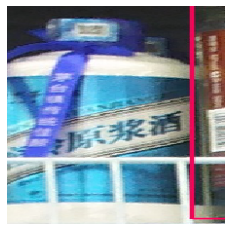

65 小郎酒45度炫彩小瓶100ml 0.18856102228164673


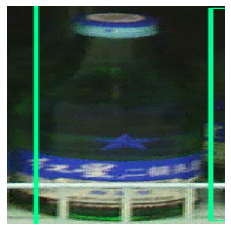

29 剑南 0.4393579065799713


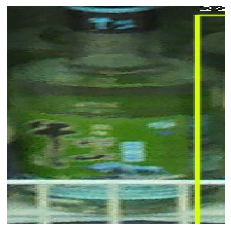

69 牛栏山56度二锅头白酒500ml 0.35539188981056213


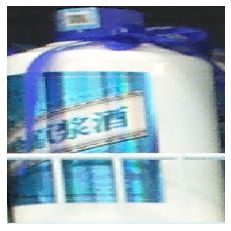

65 小郎酒45度炫彩小瓶100ml 0.18054743111133575


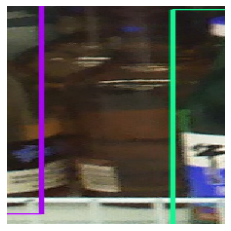

25 牛栏山42.8度十八年陈酿500ml（大青牛） 0.3103472888469696


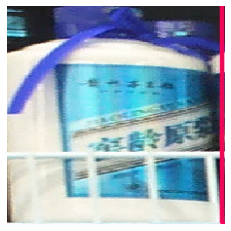

50 宣酒 0.254170298576355


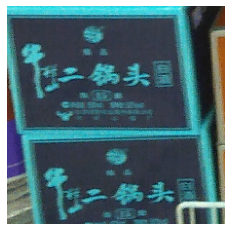

30 百年泸州老窖宫廷酒 0.1579274982213974


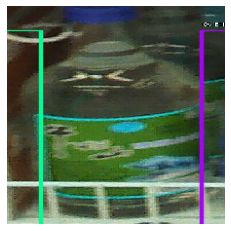

27 牛栏山42度陈酿白酒750ml 0.19694223999977112


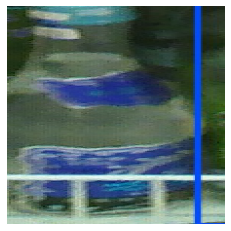

69 牛栏山56度二锅头白酒500ml 0.40233272314071655


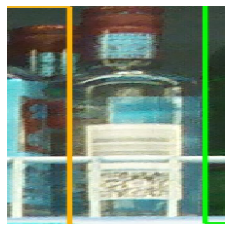

25 牛栏山42.8度十八年陈酿500ml（大青牛） 0.27822744846343994


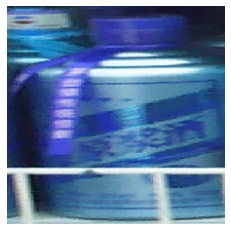

68 牛栏山43度珍品陈酿白酒500ml 0.20855581760406494


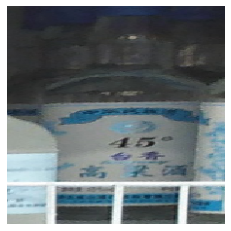

69 牛栏山56度二锅头白酒500ml 0.17953750491142273


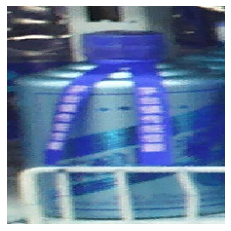

50 宣酒 0.15220752358436584


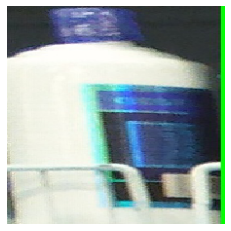

99 牛栏山41.6度小牛白酒500ml 0.4429667294025421


/root/.local/lib/python3.6/site-packages/keras_retinanet/utils/colors.py:18: UserWarning: Label 99 has no color, returning default.
  warnings.warn('Label {} has no color, returning default.'.format(label))


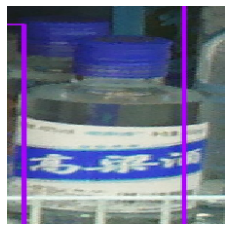

24 镇江白酒 0.23478445410728455


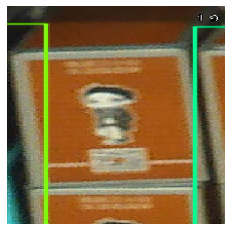

29 剑南 0.1886819303035736


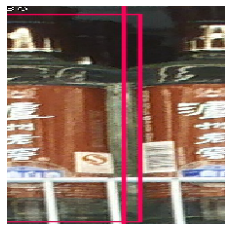

65 小郎酒45度炫彩小瓶100ml 0.6613210439682007


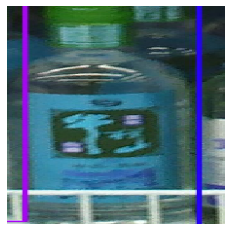

99 牛栏山41.6度小牛白酒500ml 0.2465132176876068


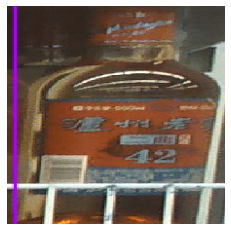

106 洋河蓝色经典52度海之蓝480ml 0.2810676097869873


/root/.local/lib/python3.6/site-packages/keras_retinanet/utils/colors.py:18: UserWarning: Label 106 has no color, returning default.
  warnings.warn('Label {} has no color, returning default.'.format(label))


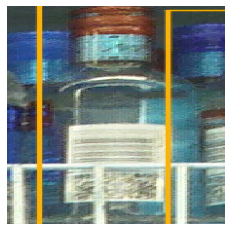

83 龙江家园 0.10741890966892242


/root/.local/lib/python3.6/site-packages/keras_retinanet/utils/colors.py:18: UserWarning: Label 83 has no color, returning default.
  warnings.warn('Label {} has no color, returning default.'.format(label))


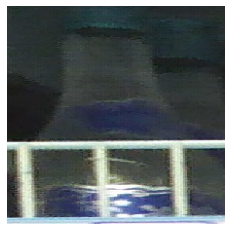

115 牛栏山53度二锅头净爽500ml 0.3562234342098236


/root/.local/lib/python3.6/site-packages/keras_retinanet/utils/colors.py:18: UserWarning: Label 115 has no color, returning default.
  warnings.warn('Label {} has no color, returning default.'.format(label))


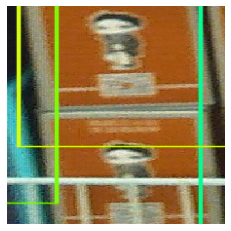

29 剑南 0.11928775906562805


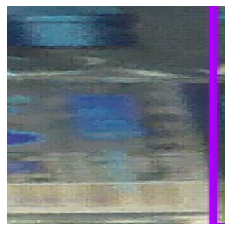

68 牛栏山43度珍品陈酿白酒500ml 0.1980067491531372


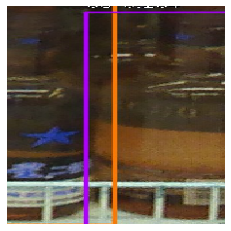

69 牛栏山56度二锅头白酒500ml 0.24102219939231873


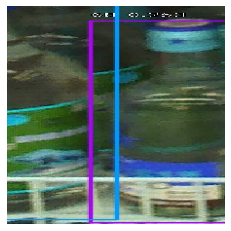

68 牛栏山43度珍品陈酿白酒500ml 0.3389027714729309


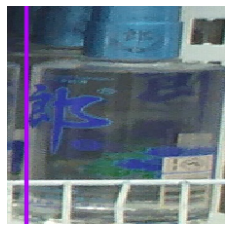

69 牛栏山56度二锅头白酒500ml 0.32195284962654114


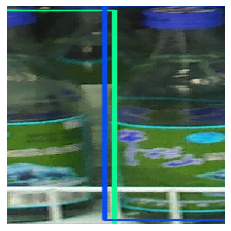

19 牛栏山42度陈酿白酒500ml 0.3495320975780487


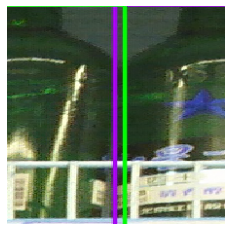

99 牛栏山41.6度小牛白酒500ml 0.7062966823577881


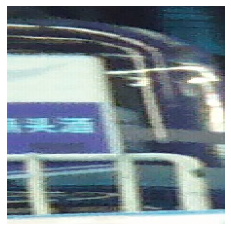

99 牛栏山41.6度小牛白酒500ml 0.6391260623931885


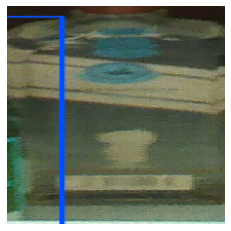

68 牛栏山43度珍品陈酿白酒500ml 0.26313361525535583


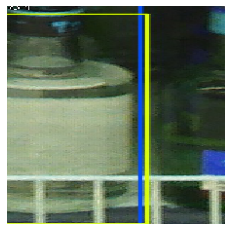

68 牛栏山43度珍品陈酿白酒500ml 0.22643253207206726


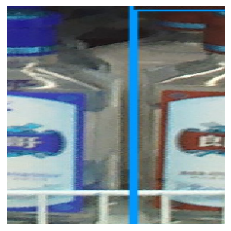

68 牛栏山43度珍品陈酿白酒500ml 0.388996422290802


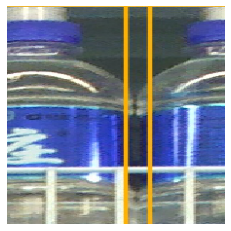

65 小郎酒45度炫彩小瓶100ml 0.17841807007789612


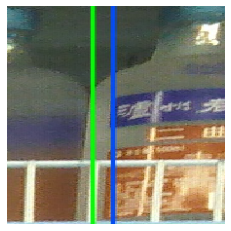

69 牛栏山56度二锅头白酒500ml 0.38613656163215637


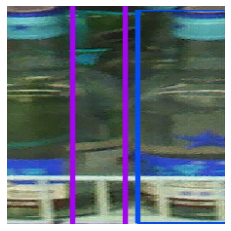

69 牛栏山56度二锅头白酒500ml 0.23237916827201843


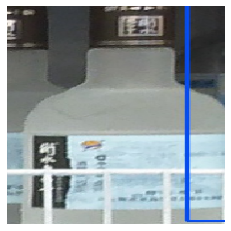

68 牛栏山43度珍品陈酿白酒500ml 0.2979602813720703
processing time:  14.190209865570068


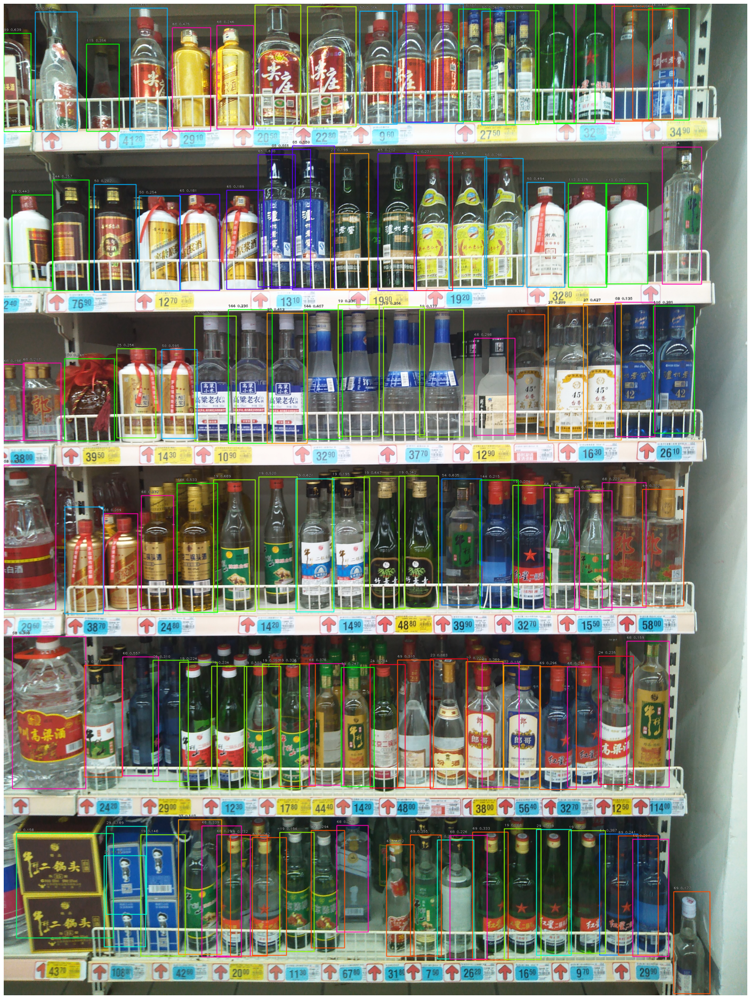

In [114]:
# 商品识别和可视化
for box, score, label in zip(boxes[0], scores[0], labels[0]):
    # 过滤小于0.5检测框
    if score < 0.5:
        break
    
    # 分类框颜色（复用RetinaNet可视化模块，颜色类别可能不够用）
    color = label_color(label)
    b = box.astype(int)
    
    # 检测框中的SKU小图
    cropped = draw[b[1]:b[3], b[0]:b[2]]
    if cropped is not None:
        image_path = f"test/{idx}.jpg"
        # 保存SKU小图结果
        cv2.imwrite(image_path, cropped)    
        # 商品识别
        img_tensor = load_image(image_path)
        pred = classifier.predict(img_tensor)
        
        sku_id = np.argmax(pred)
        sku_name = classifier_class_name[sku_id]
        sku_score = np.max(pred)
        # 添加SKU分类结果
        predict_list.append(sku_name)
        # 打印识别结果
        print(f"{sku_id} {sku_name} {sku_score}")
        # 在货架图中可视化分类结果
        caption = "{} {:.3f}".format(sku_id, sku_score)
        draw_caption(draw, b, caption)
        draw_box(draw, b, color=label_color(sku_id))
    
        idx+=1
    
print("processing time: ", time.time() - start)
plt.figure(figsize=(25, 45))
plt.axis('off')
plt.imshow(draw)
plt.show()